In [2]:
from pathlib import Path
import os

from astropy.nddata import CCDData
from astropy.visualization import hist
from astropy.stats import mad_std

import ccdproc as ccdp
import matplotlib.pyplot as plt
import numpy as np
import sys
from astropy import units as u


sys.path.append("/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline")
import fpnfix
from aperturePhot import showimage as show_image

In [3]:
path = "/home/idies/workspace/Storage/madisonleblanc/persistent/reductions_ASTR4261/"
day = "20211013"
path_day = os.path.join(path, day)

data_red = Path(path_day, "Reduced_Images")
data_red.mkdir(exist_ok = True)

In [4]:
files = ccdp.ImageFileCollection(path_day)
files.summary['file', 'imagetyp', 'filter', 'exptime', 'naxis1', 'naxis2']

file,imagetyp,filter,exptime,naxis1,naxis2
str24,str11,object,float64,int64,int64
Asteroid1_001R.fit,Light Frame,Bessel R,30.0,1024,1024
Asteroid1_002R.fit,Light Frame,Bessel R,30.0,1024,1024
Asteroid1_003R.fit,Light Frame,Bessel R,30.0,1024,1024
Asteroid1_004R.fit,Light Frame,Bessel R,30.0,1024,1024
Asteroid1_005R.fit,Light Frame,Bessel R,30.0,1024,1024
Asteroid1_006R.fit,Light Frame,Bessel R,30.0,1024,1024
Asteroid1_007R.fit,Light Frame,Bessel R,30.0,1024,1024
Asteroid1_008R.fit,Light Frame,Bessel R,30.0,1024,1024
Asteroid1_009R.fit,Light Frame,Bessel R,30.0,1024,1024


In [5]:
calibrated_biases = files.files_filtered(imagetyp='Bias Frame', include_path=True)

combined_bias = ccdp.combine(calibrated_biases,
                             method='median',
                             sigma_clip=True, sigma_clip_low_thresh=5, sigma_clip_high_thresh=5,
                             sigma_clip_func=np.ma.median, sigma_clip_dev_func=mad_std, unit = "adu")

combined_bias.meta['combined'] = True

combined_bias.write(os.path.join(data_red / 'combined_bias.fit'), overwrite = True)

In [6]:
calibrated_darks = files.files_filtered(imagetyp='Dark Frame', include_path=True)
reduced_darks= []
exptime= []

for frame in calibrated_darks:
    image = ccdp.CCDData.read(frame, unit = 'adu')
    exptime.append(image.header["exposure"])
    reduced_darks.append(ccdp.subtract_bias(image, combined_bias))
    
combined_darks = ccdp.combine(reduced_darks,
                             method='median',
                             sigma_clip=True, sigma_clip_low_thresh=5, sigma_clip_high_thresh=5,
                             sigma_clip_func=np.ma.median, sigma_clip_dev_func=mad_std, unit = "adu", scale =1 / np.array(exptime))

combined_darks.header["exposure"] = 1
combined_darks.header['exptime'] = 1

combined_darks.meta['combined'] = True

combined_darks.write(os.path.join(data_red / 'combined_darks.fit'), overwrite = True)

15.147444034988064 16.18208279203938
-38.336939746689616 100.44073244676363


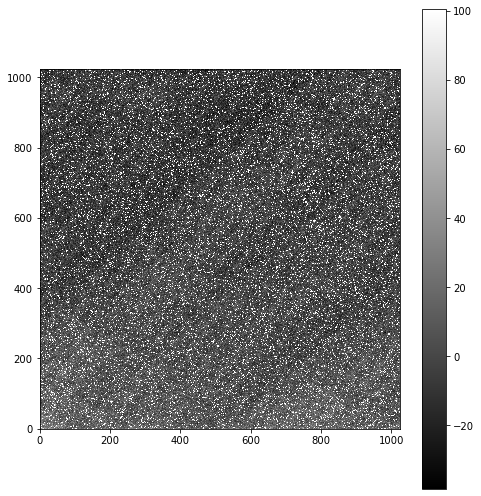

In [7]:
import fpnfix
import ccdproc
import aperturePhot as ap


os.chdir(path_day)
combfpn = fpnfix.buildFPNFrame(files, redpath = "./Reduced_Images", darkim = "combined_darks.fit") #Note this assumes that the SO Darks were taken as 'Light Frame' 
                                       #with OBJECT='SODark' - use imagetyp and object keyword arguments 
                                       #to change this if needed
                                       
#Show the combined FPN frame build from 60 second SO Darks               
ap.showimage(combfpn[60])

In [8]:
flat_imagetyp = 'Flat Field'

flat_filters = set(h['filter'] for h in files.headers(imagetyp=flat_imagetyp))
flat_filters

{'Bessel B', 'Bessel R', 'Bessel V'}

Before image 
7681.794679284098 66.59345000000044
7394.75 7870.541666666667


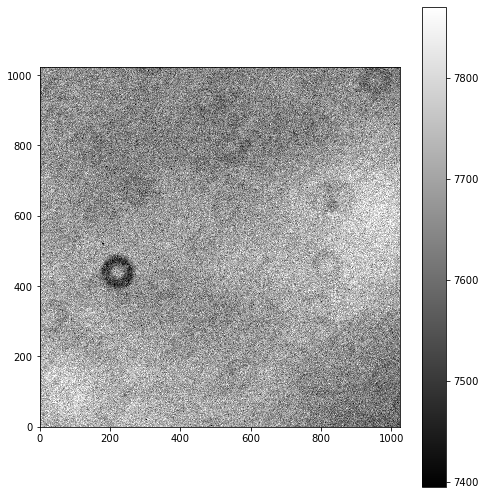

intercept, slope = -0.008517618220299015 -0.002542541059017337


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00254254
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


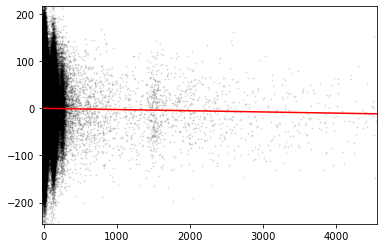

Corrected image
7681.833192282494 66.59036587674096
7394.727147118969 7870.615576645529


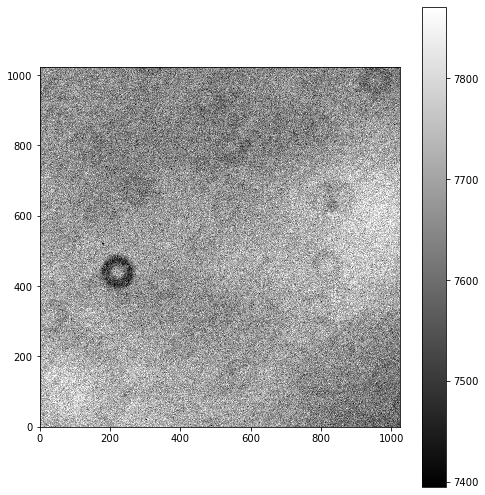

Before image 
7740.322847008708 68.57025
7517.416666666667 7948.166666666667


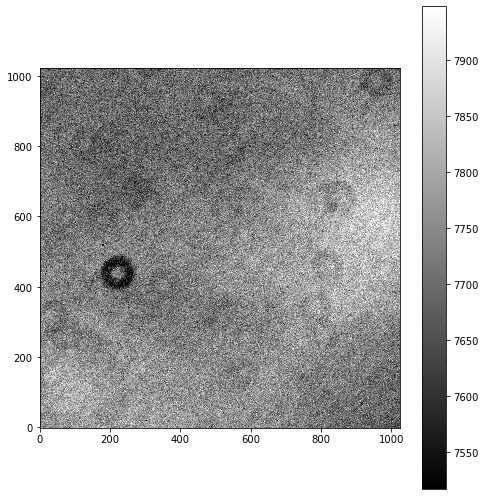

intercept, slope = 0.10450707255414743 -0.005667025924128501


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00566703
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


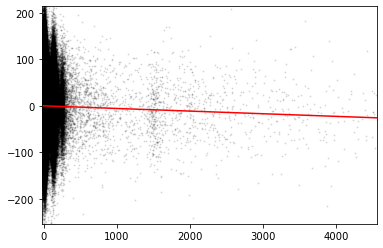

Corrected image
7740.408687966732 68.56178573435895
7517.259879539851 7948.133862231301


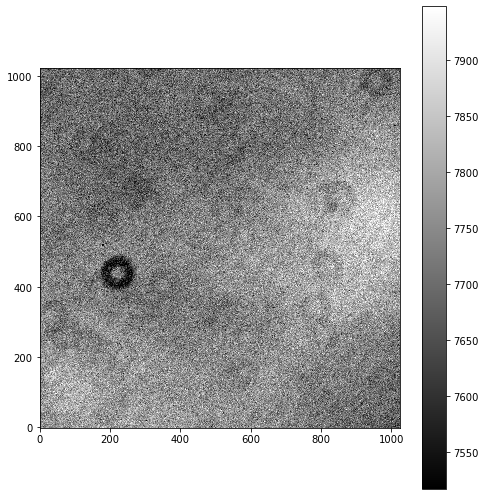

Before image 
7747.739109635356 68.5084750000009
7492.75 7989.791666666667


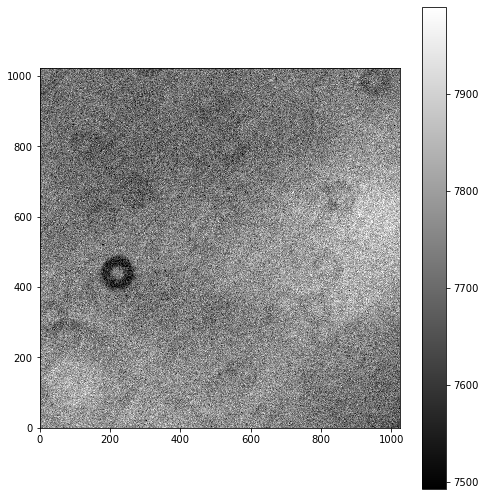

intercept, slope = 0.04399017294113348 -0.0045835674991388615


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00458357
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


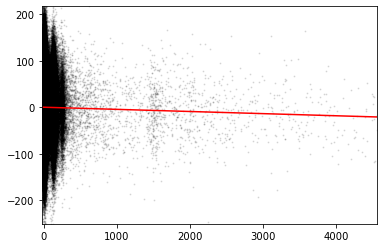

Corrected image
7747.808538967526 68.52996628085677
7492.708801954296 7990.636072765243


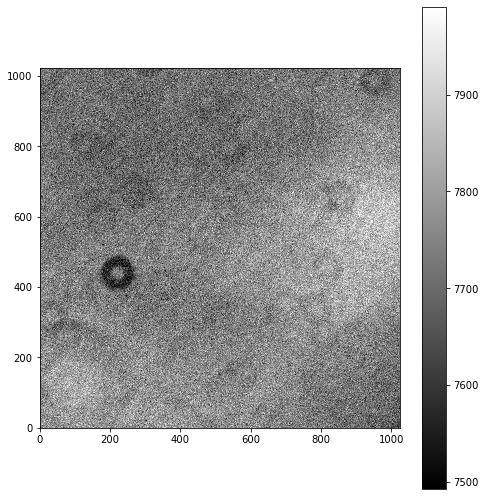

Before image 
7775.706720948222 68.81735000000045
7468.75 8040.458333333333


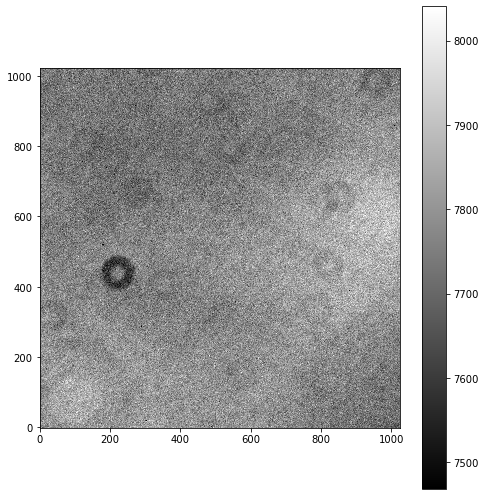

intercept, slope = 0.016306862573192433 -0.0037912486775492325


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00379125
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


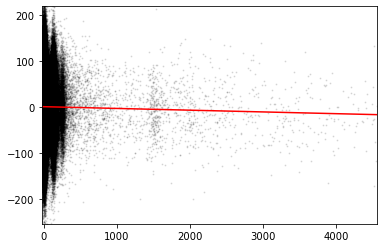

Corrected image
7775.764148675384 68.84570667127132
7468.7159234785295 8040.469708835635


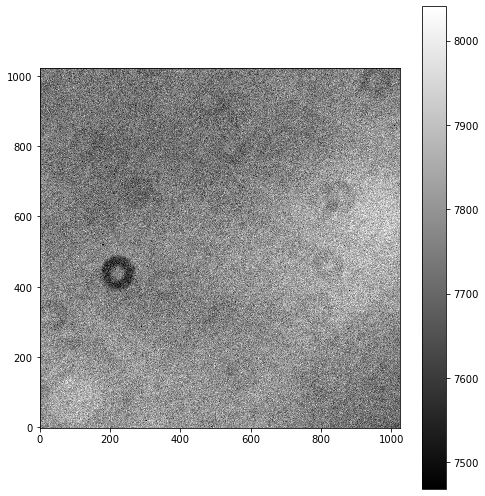

Before image 
7903.161149621013 69.496875
7693.75 8118.791666666667


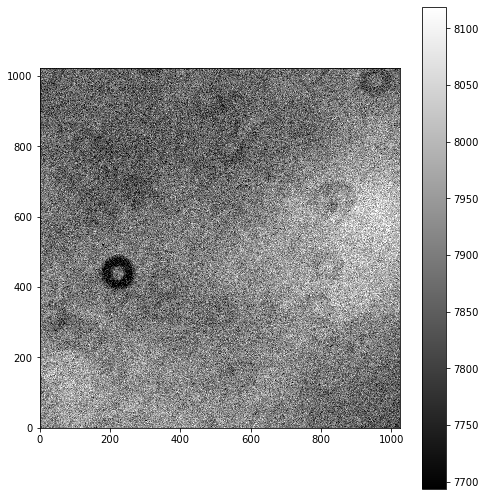

intercept, slope = 0.0028468202668581965 -0.0031095822294132072


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00310958
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


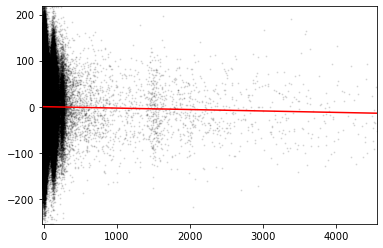

Corrected image
7903.208251843799 69.52745296156895
7693.740631870535 8118.778529133834


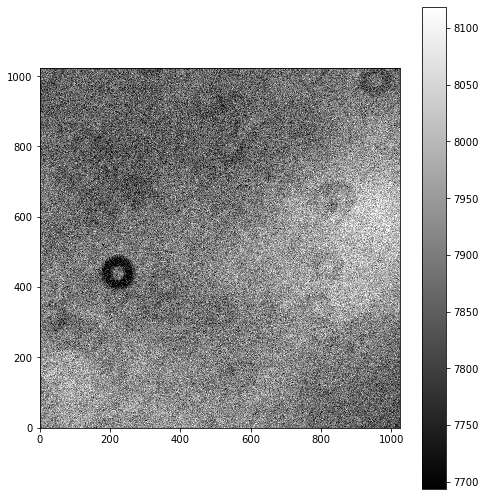

Before image 
7914.801049828532 69.5586499999991
7635.75 8173.166666666667


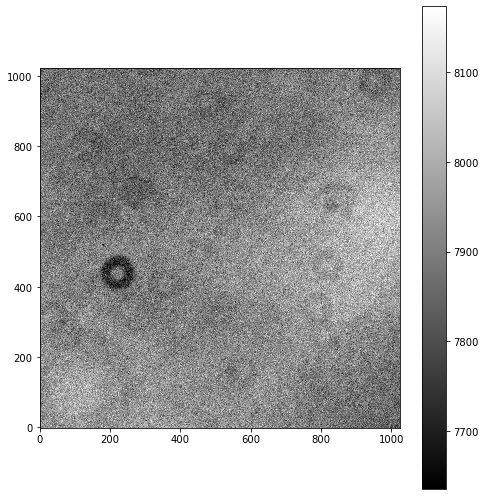

intercept, slope = -0.014995801744906835 -0.0027526141743191724


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00275261
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


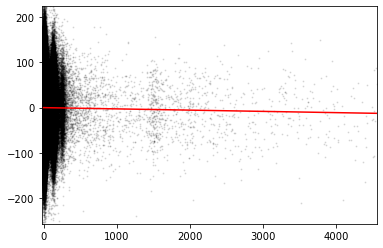

Corrected image
7914.842744897683 69.55828521971823
7635.72525893868 8173.151950814947


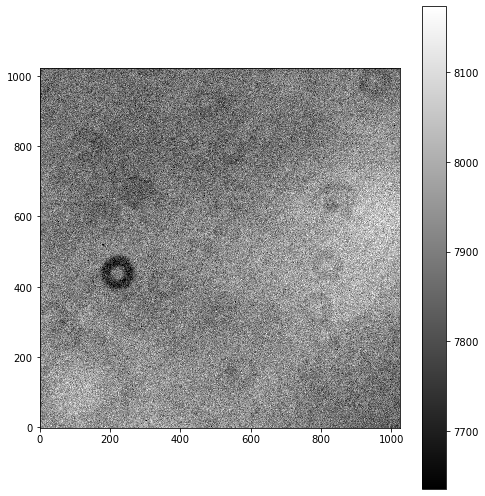

Before image 
10532.499526262278 81.6665500000009
10235.166666666666 10836.916666666666


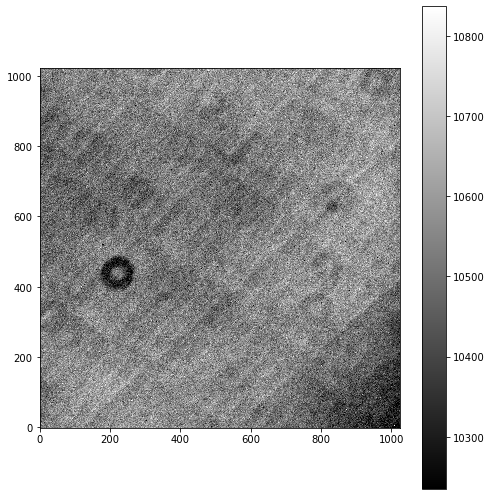

intercept, slope = -0.15696004444326217 0.01360346825080372


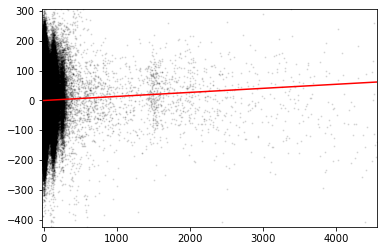

Corrected image
10532.293468488266 81.69700313018211
10235.280593829988 10837.15076902113


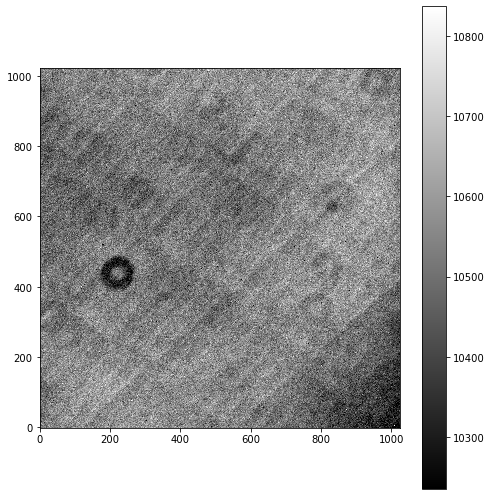

Before image 
10740.503739595408 87.10275
10457.5 11013.5


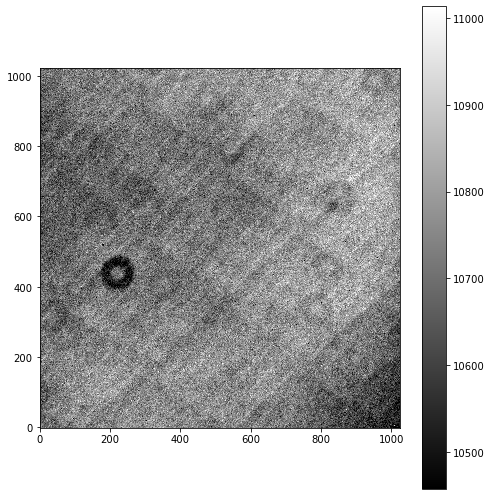

intercept, slope = 0.035337963359357925 -0.008843322313879852


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00884332
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


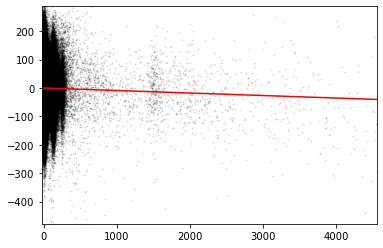

Corrected image
10740.637693325245 87.09282322897752
10457.420514403479 11013.53997438094


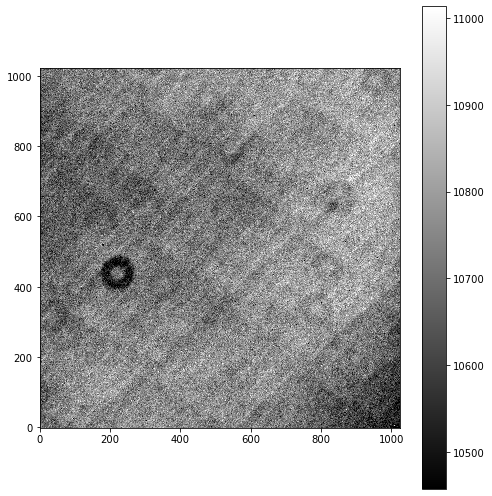

Before image 
10781.950220346445 86.9792000000018
10434.333333333334 11028.666666666666


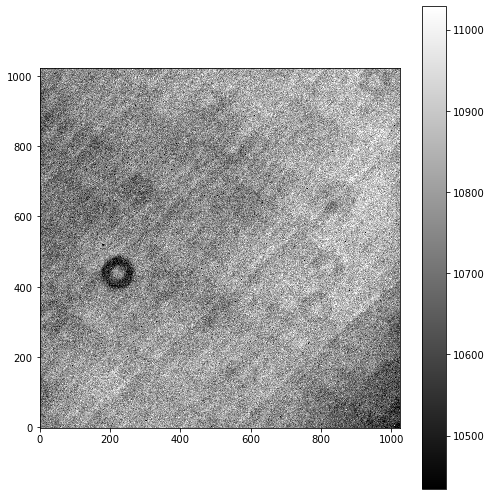

intercept, slope = 0.08563125005602235 -0.016358578107343247


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.0163586
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


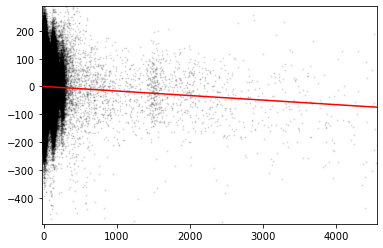

Corrected image
10782.19801099282 86.99923077230966
10434.766684531625 11032.486727058313


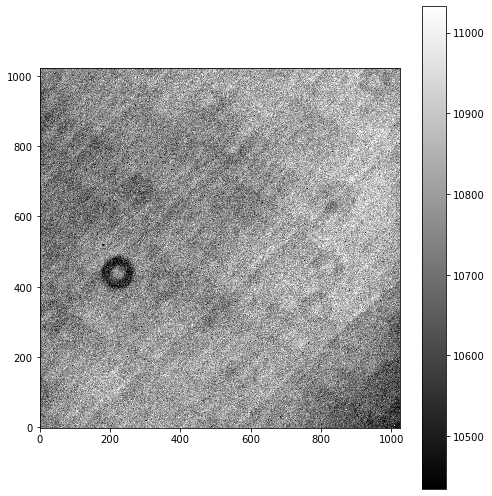

Before image 
10810.290765047068 85.8672499999991
10455.5 11096.333333333334


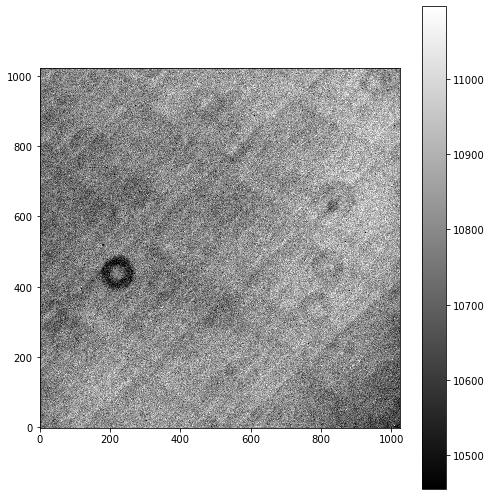

intercept, slope = 0.041730920843809784 -0.007964086186499419


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00796409
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


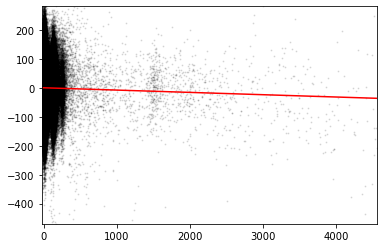

Corrected image
10810.411400596871 85.85631390470228
10455.428417158302 11096.386158944604


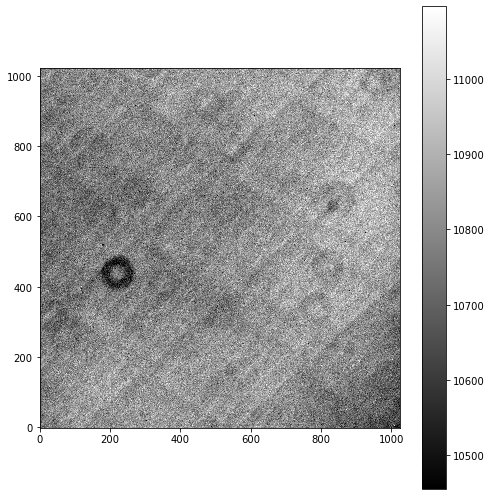

Before image 
11052.754538774487 87.22630000000089
10706.5 11333.666666666666


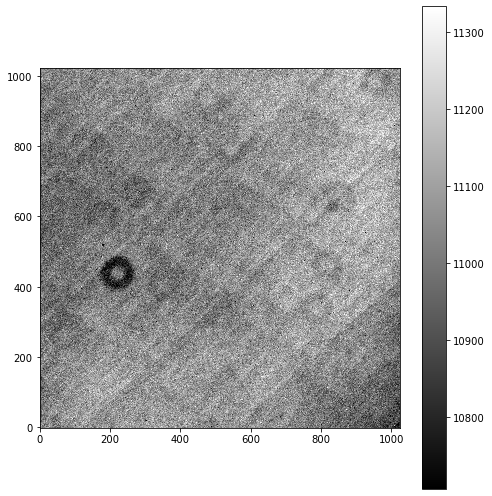

intercept, slope = -0.05744319928150288 -0.001531080076507099


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00153108
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


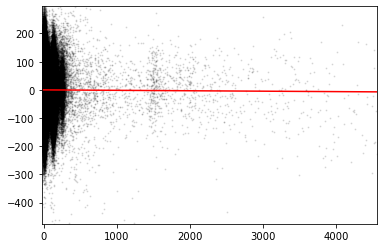

Corrected image
11052.777730724254 87.22324459363448
10706.486238337937 11333.66922676144


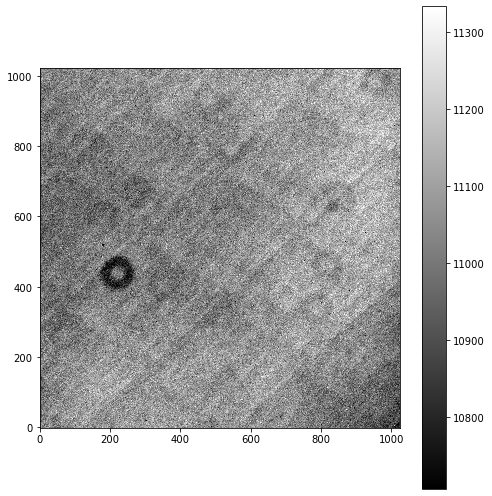

Before image 
11067.242141962048 88.95599999999999
10684.5 11354.416666666666


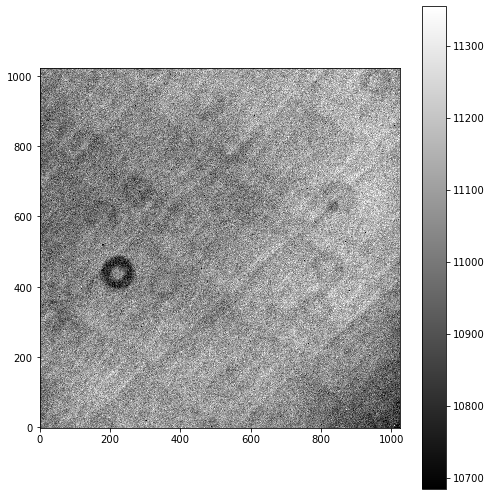

intercept, slope = -0.13637802063013832 0.0010358045526852248


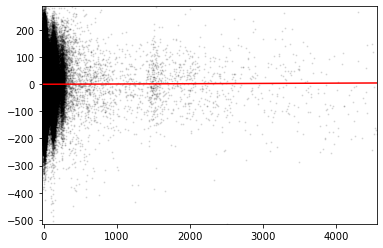

Corrected image
11067.226452170551 88.93150799940521
10684.509310023974 11354.42104279031


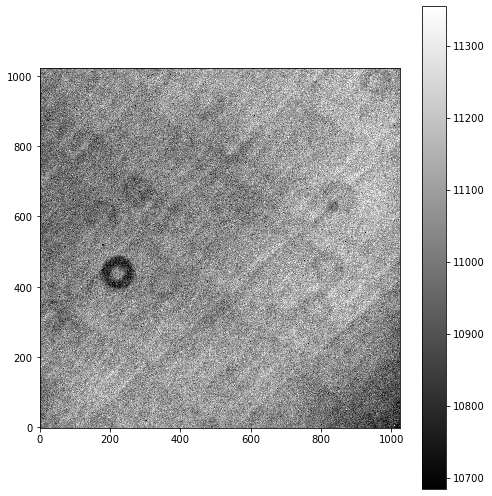

Before image 
11357.614779937267 124.66812749999946
10912.825 11912.1375


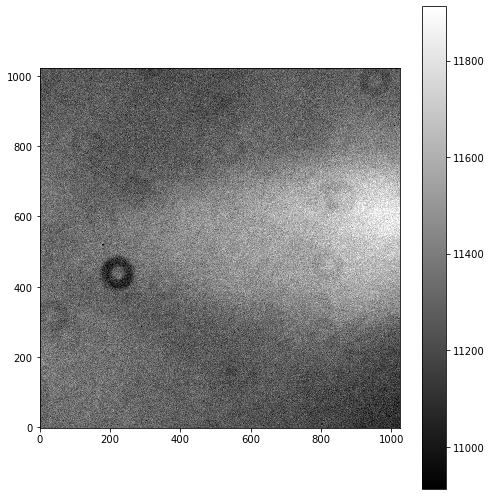

intercept, slope = 0.17623290589577664 -0.005945133387177592


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00594513
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


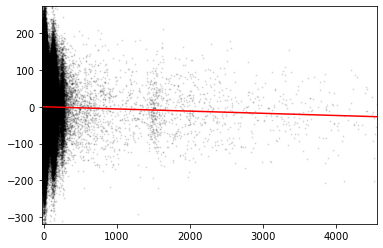

Corrected image
11357.704833512533 124.67337832047797
10912.77156392056 11912.784049591926


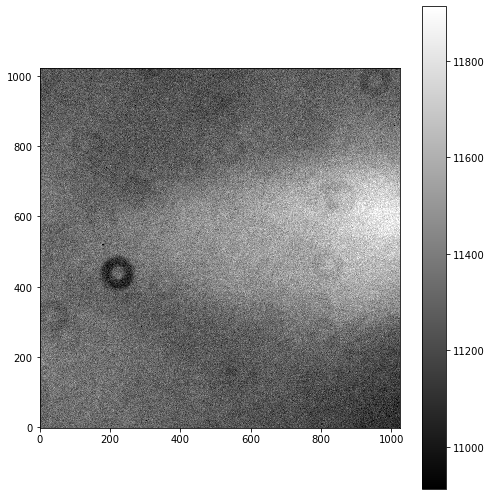

Before image 
11520.623720633983 124.94611499999945
11121.5375 12207.65


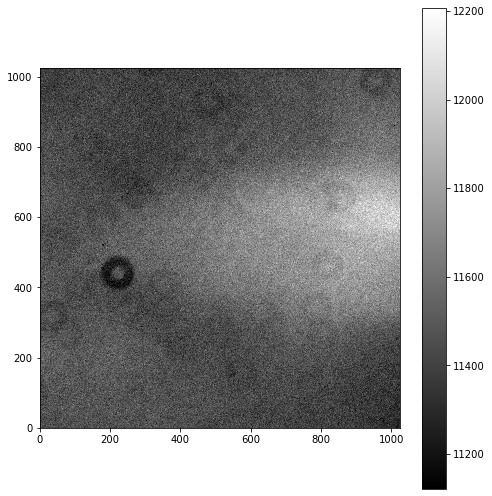

intercept, slope = 0.07716286915307828 -0.006644686127988939


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00664469
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


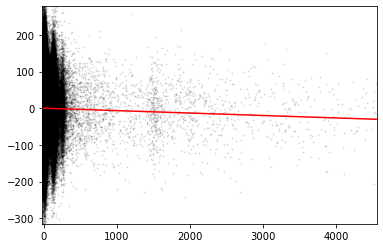

Corrected image
11520.72437064524 124.93845843092448
11122.317439173052 12207.611536230903


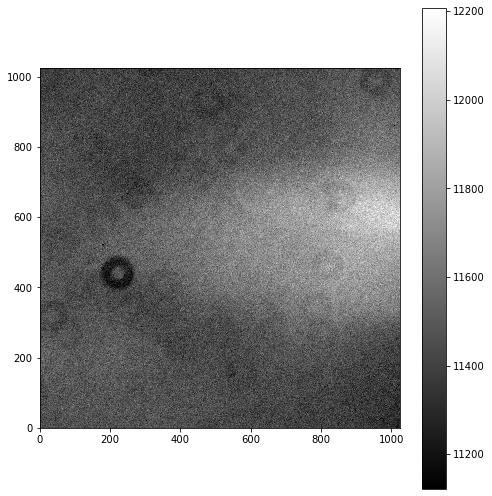

Before image 
11530.0720438838 124.66812749999946
11076.825 12081.4625


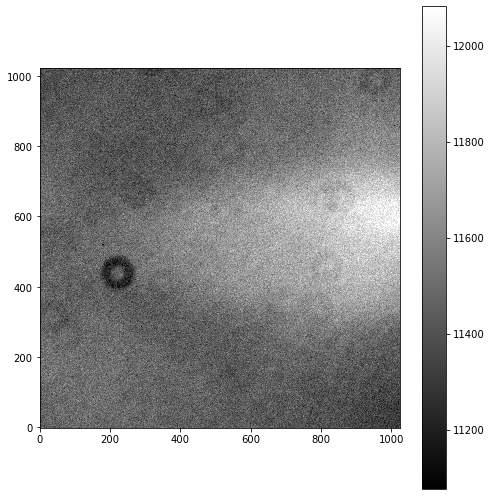

intercept, slope = 0.049832491340793844 -0.007146007397982158


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00714601
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


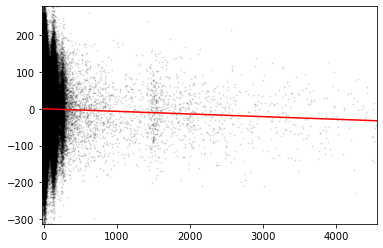

Corrected image
11530.180287630932 124.65382681318748
11076.760770218409 12081.507214495256


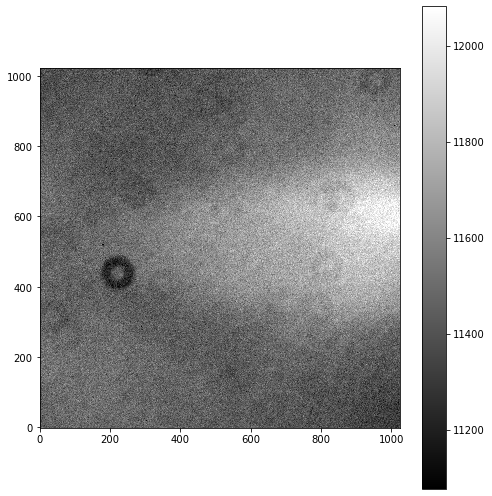

Before image 
11546.646615493297 125.44649249999891
11194.35 12145.4625


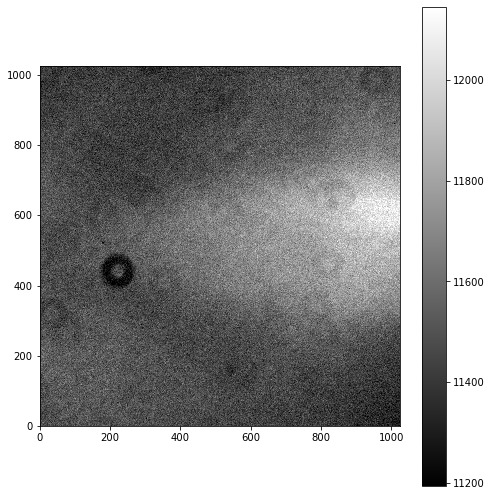

intercept, slope = 0.007407479297980314 -0.0019910160485492887


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00199102
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


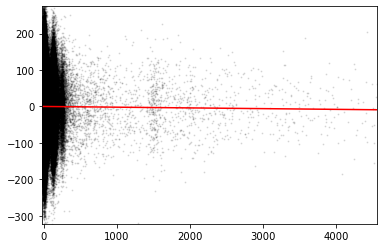

Corrected image
11546.676774297463 125.45110234047777
11194.300416400265 12145.474958324305


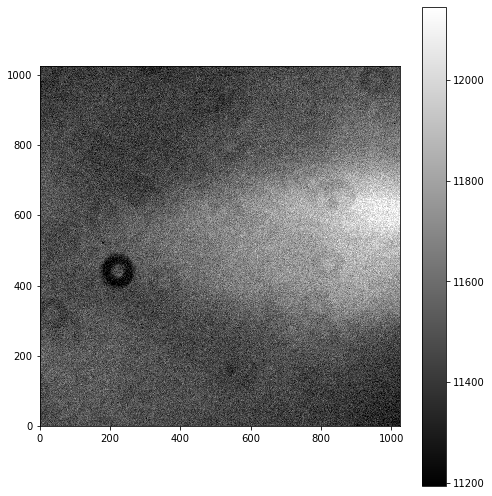

Before image 
11749.816759574414 127.91131499999945
11310.825 12307.1875


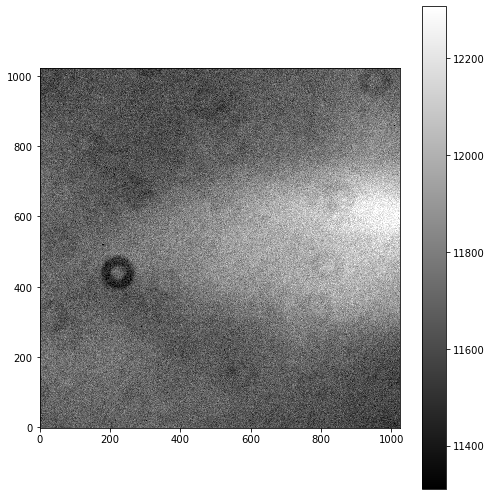

intercept, slope = 0.03568790775728779 -0.0068004097468167225


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00680041
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


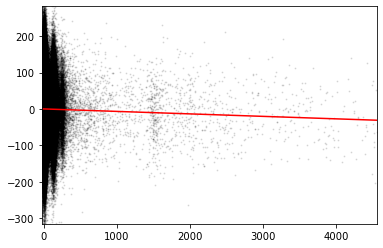

Corrected image
11749.919768400472 127.92004720136416
11310.763876521049 12307.160061266633


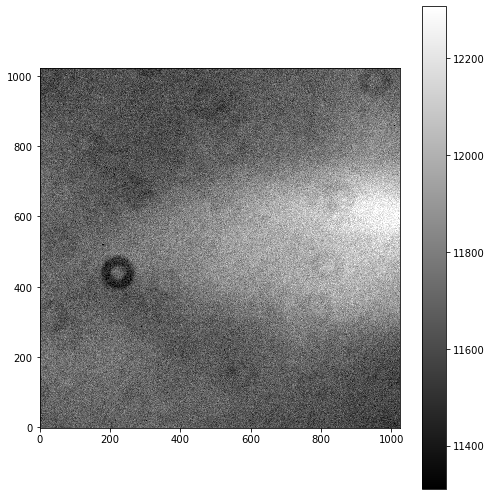

Before image 
11744.94588135481 127.11441749999892
11367.825 12389.1375


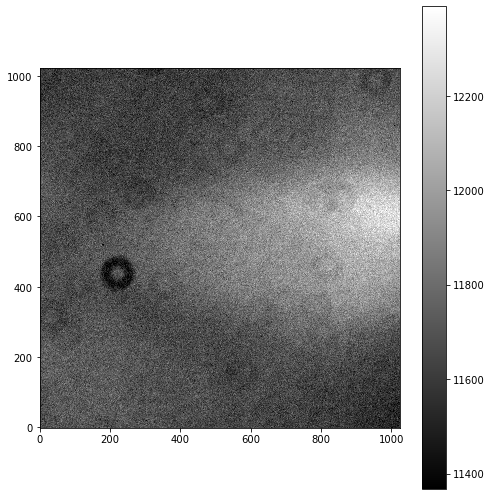

intercept, slope = -0.029872196749448094 -0.006902393531735321


/home/idies/workspace/Storage/madisonleblanc/persistent/hrpo-pipeline/fpnfix.py:372: UserWarning: Slope fitted to scale fixed pattern noise was negative or zero, something probably went wrong. Slope = -0.00690239
  warnings.warn("Slope fitted to scale fixed pattern noise was negative or zero," +


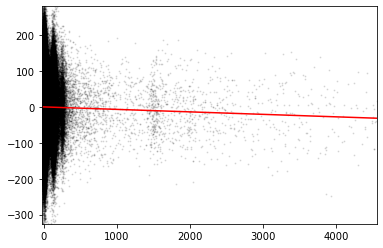

Corrected image
11745.050434974537 127.12249181668403
11367.762959869853 12389.888154263012


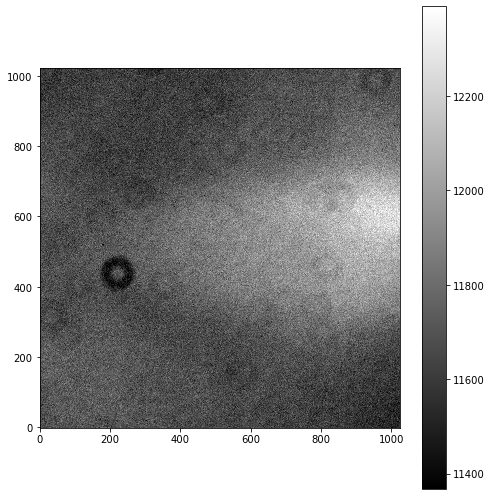

In [9]:
scale = lambda a: 1/np.median(a)

master_flats = {}

for filt in flat_filters:
    reduced_flats = []
    calibrated_flats = files.files_filtered(imagetyp = flat_imagetyp, filter = filt, include_path=True)
    
    for flat in calibrated_flats:
        image = ccdp.CCDData.read(flat, unit = "adu")
        image = ccdp.subtract_bias(image, combined_bias)
        image = ccdp.subtract_dark(image, combined_darks, scale=True, exposure_unit=u.s, exposure_time = "exptime")
        image = fpnfix.subtract_fpn(image,combfpn[60],mesh_size=32, verbose = 2)
        reduced_flats.append(image)
    
    combined_flats = ccdp.combine(reduced_flats,
                                 method='median',
                                 sigma_clip=True, sigma_clip_low_thresh=5, sigma_clip_high_thresh=5,
                                 sigma_clip_func=np.ma.median, signma_clip_dev_func=mad_std, unit = "adu", scale = scale
                                )

    master_flats[filt]=combined_flats.copy()

    combined_flats.write(data_red / (filt.replace("","_")+"_combined_flats.fit"), overwrite = True)

810.7875146865845 2.2239
805.0 822.8617063329625


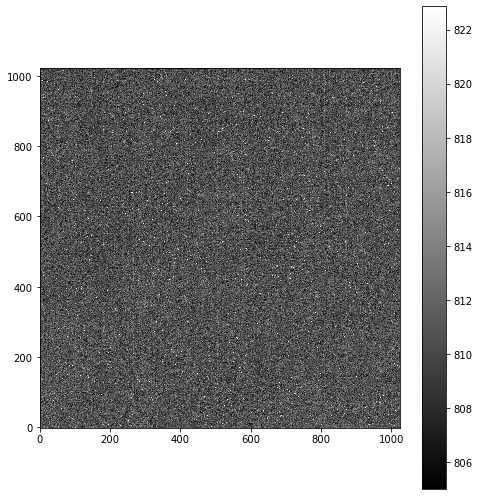

In [10]:
show_image(combined_bias)

1.8195454359054568 0.24709999999999976
1.0916666666666666 3.045705092699698


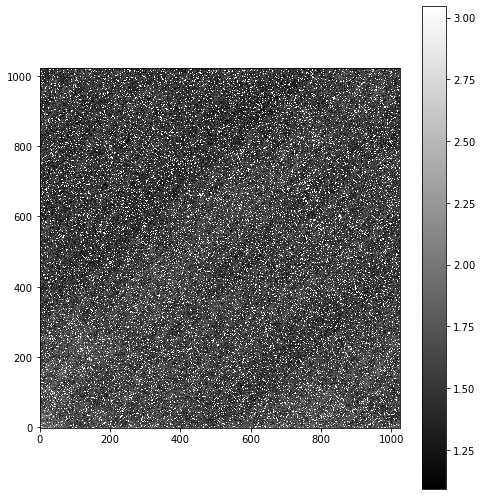

In [11]:
show_image(combined_darks)

1.0001255908667357 0.00658488032803157
0.9660446972446237 1.0238908738741137


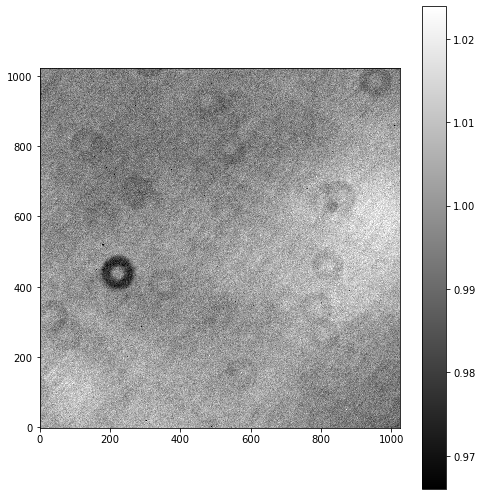

0.9998077778575281 0.00622818084645066
0.9700413550045588 1.0179045979528154


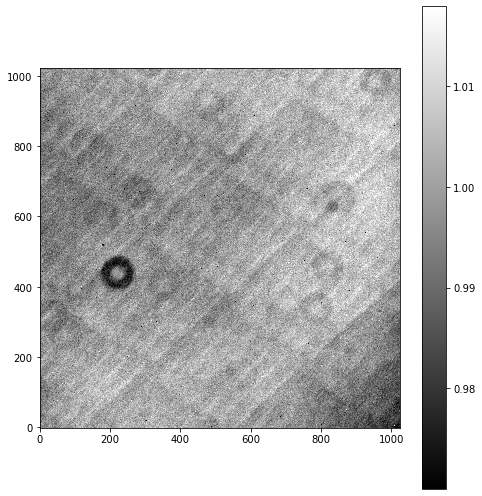

1.002661870070928 0.008932431686609576
0.9678735887330077 1.047783651724934


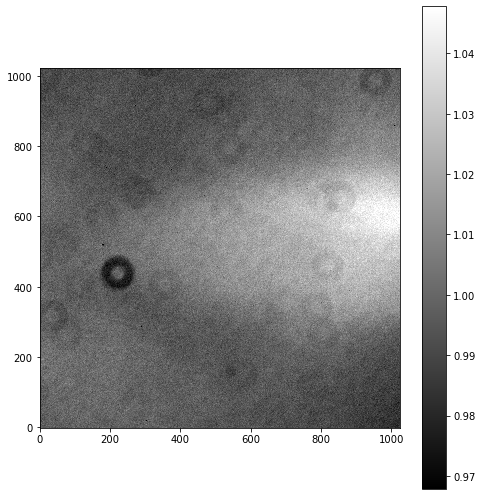

In [12]:
for filt,image in master_flats.items():
    show_image(image)

In [13]:
images = files.files_filtered(imagetyp="Light Frame", include_path = True)

for image in images:
    var = ccdp.CCDData.read(image, unit = "adu")
    var_filt = var.header["filter"]
    
    corr_filt = master_flats[var_filt]
    
    var = ccdproc.ccd_process(var,
                             master_bias = combined_bias, dark_frame = combined_darks,
                             master_flat = corr_filt, exposure_key="exposure", exposure_unit = u.second,
                             dark_scale = True)
    proc_data = os.path.basename(image)
    var.write(data_red / ("BDF_"+proc_data), overwrite = True)

In [14]:
data = "/home/idies/workspace/Storage/madisonleblanc/persistent/reductions_ASTR4261/20211013/Reduced_Images/BDF_Ross154-001V.fit"
V = os.path.join(path, data)

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
645.0405223715469 20.660554639369778
589.9165414525011 735.9898567511444


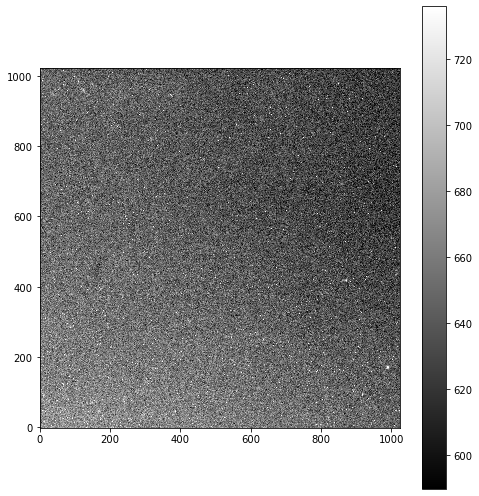

In [15]:
Vimage = ccdp.CCDData.read(V, unit="adu")
show_image(Vimage)

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
441.99638773510617 17.453334558683324
380.13894287315645 551.4907717634799


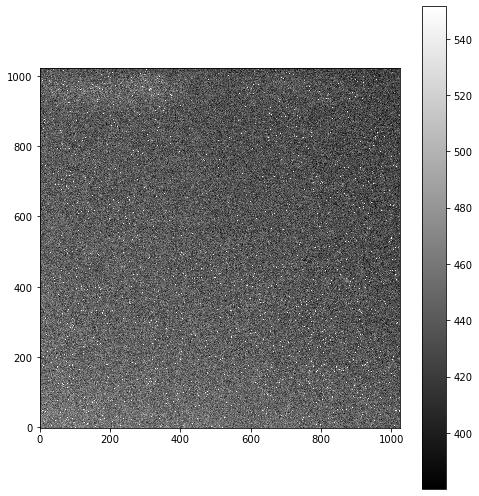

In [17]:
data = "/home/idies/workspace/Storage/madisonleblanc/persistent/reductions_ASTR4261/20211013/Reduced_Images/BDF_Ross154-001B.fit"
B = os.path.join(path, data)
Bimage = ccdp.CCDData.read(B, unit="adu")
show_image(Bimage)

INFO:astropy:using the unit adu passed to the FITS reader instead of the unit adu in the FITS file.


INFO: using the unit adu passed to the FITS reader instead of the unit adu in the FITS file. [astropy.nddata.ccddata]
778.9926230183901 24.528212201190048
710.4547171844088 876.108032944788


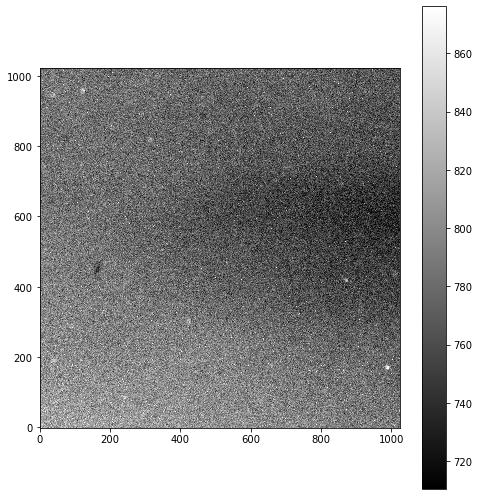

In [18]:
data = "/home/idies/workspace/Storage/madisonleblanc/persistent/reductions_ASTR4261/20211013/Reduced_Images/BDF_Ross154-001R.fit"
R = os.path.join(path, data)
Rimage = ccdp.CCDData.read(R, unit="adu")
show_image(Rimage)

In [ ]:
import plateSolve

check = plateSolve.autoSolve(R,Rimage)
print("Check should be true if autoSolve worked correctly.")
print(V,check)
print(check)

In [ ]:
plateSolve.manualSolvePlot(V,Vimage)

In [ ]:
gaia_list = [0,1, 3, 9, 12,17,22,24,54]
image_list = [0,1,4,5,8, 11, 13, 15,16]

check = plateSolve.manualSolve(V,Vimage,gaia_list,image_list)
print("Check is True if successful")
print(V,check)